In [1]:
import numpy as np
from matplotlib import pyplot as plt
import math
from math import exp, sqrt, pi
import time

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset,RandomSampler

In [2]:
epochs = 50
device = torch.device("cpu")

eps = 1

learning_rate = 1e-3
batchflag = True
batchsize = 128

start = 0.
end = 1.
x = np.linspace(start,end,100 )
y = np.linspace(start,end,100)
x, y = np.meshgrid(x, y)
x = np.reshape(x, (np.size(x[:]),1))
y = np.reshape(y, (np.size(y[:]),1))

def actual_soln(eps):
    p = 1 - np.exp(-1/eps);q = 1 + np.exp(-1/eps);d = 1/(q - 2*eps*p)
    return (np.sin(np.pi*x) + (eps*np.pi/p)*(np.exp(-x/eps) + np.exp((x-1)/eps) - q) ) * (2*y*(1 - y**2) + eps * ( p*d*(1-2*y) - 3*q/p + (3/p - d)*np.exp(-y/eps) + (3/p + d)*np.exp((y-1)/eps)))


In [3]:
def plot_graph(soln,soln_name):
    x = np.linspace(start,end,100);y = np.linspace(start,end,100)
    x,y = np.meshgrid(x,y)
    ax = plt.axes(projection='3d')
    ax.plot_surface(x,y,soln.reshape(100,100))
    plt.title(soln_name)
    plt.show()

def plot_graphs(soln1,soln2,soln_name):
    x = np.linspace(start,end,100);y = np.linspace(start,end,100)
    x,y = np.meshgrid(x,y)
    ax = plt.axes(projection='3d')
    ax.plot_surface(x,y,soln1.reshape(100,100))
    plt.title(soln_name)
    plt.show()

class Swish(nn.Module):
	def __init__(self, inplace=True):
		super(Swish, self).__init__()
		self.inplace = inplace

	def forward(self, x):
		if self.inplace:
			x.mul_(torch.sigmoid(x))
			return x
		else:
			return x * torch.sigmoid(x)
	

class FBPINN(nn.Module):
	hid_dim = 128
	input_dim = 2 
	def __init__(self):
		super(FBPINN, self).__init__()
		self.tanh = nn.Tanh()
		self.lin0 = nn.Linear(self.input_dim,self.hid_dim)
		self.lin = nn.Linear(self.hid_dim,self.hid_dim)
		self.lin1 = nn.Linear(self.hid_dim,1)
		self.swish = Swish()


	def forward(self,x):		
		tanh1 = self.tanh(x)
		tanh2 = self.tanh(1 - x)
		tanh11 = (tanh1[:,0].unsqueeze(1))*(tanh1[:,1].unsqueeze(1))*(tanh1[:,0].unsqueeze(1))*(tanh1[:,1].unsqueeze(1))
		tanh22 = (tanh2[:,0].unsqueeze(1))*(tanh2[:,1].unsqueeze(1))*(tanh2[:,0].unsqueeze(1))*(tanh2[:,1].unsqueeze(1))
		x = self.lin0(x)
		x = self.swish(x)
		x = self.lin(x)
		x = self.swish(x)
		x = self.lin(x)
		x = self.swish(x)
		x = self.lin(x)
		x = self.swish(x)
		x = self.lin1(x)
		out = x*tanh11*tanh22
		return out

In [4]:

def train(device,net,x,y,eps,learning_rate,epochs,batch_flag,batch_size):

	xnet = torch.Tensor(x)
	ynet = torch.Tensor(y) 
	
	if(batch_flag):
		dataset = TensorDataset(xnet,ynet)
		dataloader = DataLoader(dataset, batch_size=batch_size,shuffle=True,num_workers = 0,drop_last = True )
		#print(len(dataloader))
	
	optimizer = optim.Adam(net.parameters(), lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)

	def Loss_criterion(xnet,ynet):
		xnet.requires_grad = True
		ynet.requires_grad = True
		points = torch.cat((xnet,ynet),1) 
		U = net(points)
		U = U.view(len(U),-1)
		
		p = 1 - np.exp(-1/eps);q = 1 + np.exp(-1/eps);d = 1/(q - 2*eps*p)
		
		soln = (torch.sin(np.pi*xnet) + (eps*np.pi/p)*(torch.exp(-xnet/eps) + torch.exp((xnet-1)/eps) - q) ) * (2*ynet*(1 - ynet*ynet) + eps * ( p*d*(1-2*ynet) - 3*q/p + (3/p - d)*torch.exp(-ynet/eps) + (3/p + d)*torch.exp((ynet-1)/eps)))
		
		soln_x = torch.autograd.grad(soln,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		soln_xx = torch.autograd.grad(soln_x,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		soln_xxx = torch.autograd.grad(soln_xx,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		soln_xxxx = torch.autograd.grad(soln_xxx,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		soln_y = torch.autograd.grad(soln,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		soln_yy = torch.autograd.grad(soln_y,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		soln_yyy = torch.autograd.grad(soln_yy,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		soln_yyyy = torch.autograd.grad(soln_yyy,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		soln_xxy = torch.autograd.grad(soln_xx,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		soln_xxyy = torch.autograd.grad(soln_xxy,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		
		f = (eps**2)*(soln_xxxx + soln_yyyy + 2*soln_xxyy) - (soln_xx + soln_yy)
		
		U_x = torch.autograd.grad(U,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		U_xx = torch.autograd.grad(U_x,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		U_xxx = torch.autograd.grad(U_xx,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		U_xxxx = torch.autograd.grad(U_xxx,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		U_y = torch.autograd.grad(U,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		U_yy = torch.autograd.grad(U_y,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		U_yyy = torch.autograd.grad(U_yy,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		U_yyyy = torch.autograd.grad(U_yyy,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		U_xxy = torch.autograd.grad(U_xx,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		U_xxyy = torch.autograd.grad(U_xxy,ynet,grad_outputs=torch.ones_like(ynet),create_graph = True,only_inputs=True)[0]
		loss1 = (eps**2)*(U_xxxx + U_yyyy + 2*U_xxyy) - (U_xx + U_yy) - f 
		
		return nn.MSELoss()(loss1,torch.zeros_like(loss1)) 

	losses = []
	tic = time.time()

	if(batch_flag):
		for epoch in range(epochs):
			if epoch == 30:
				learning_rate = 0.00001
				new_optimizer = optim.Adam(net.parameters(), lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)
				optimizer = new_optimizer
			for batch_idx, (x_in,y_in) in enumerate(dataloader):

				net.zero_grad()
				loss = Loss_criterion(x_in,y_in)
				loss.backward()

				optimizer.step() 
				if batch_idx % 20 == 0:
					print('Train Epoch: {} \tLoss: {:.20f}'.format(epoch, loss.item()))

			points = torch.cat((xnet,ynet),1)
			U = net(points)
			z = U.detach().numpy()
			actual_loss = np.square(actual_soln(eps) - z).mean()
			print('\nAfter Epoch {}, \t Actual solution loss: {:.20f}\n'.format(
				epoch, actual_loss))
			if epoch % 1 == 0:
				plot_graph(z,'Predicted solution')
			
			losses.append([loss.item(),actual_loss])

	else:
		for epoch in range(epochs):
			if epoch == 50:
				learning_rate = 0.00001
				new_optimizer = optim.Adam(net.parameters(), lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)
				optimizer = new_optimizer
		
			net.zero_grad()
			loss = Loss_criterion(xnet,ynet)
			loss.backward()
			
			optimizer.step() 
			points = torch.cat((xnet,ynet),1)
			U = net(points)
			z = U.detach().numpy()
			actual_loss = np.square(actual_soln(eps) - z).mean()
			print('\nAfter Epoch {}, \t Actual solution loss: {:.20f}\n'.format(
				epoch, actual_loss))
			if epoch % 5 == 0:
				plot_graph(z,'Predicted solution')
			
			losses.append([loss.item(),actual_loss])

	toc = time.time()
	elapseTime = toc - tic
	print ("Time elapsed = ", elapseTime)

	net_in = torch.cat((xnet,ynet),1)
	output = net(net_in)  
	
	return output,net 

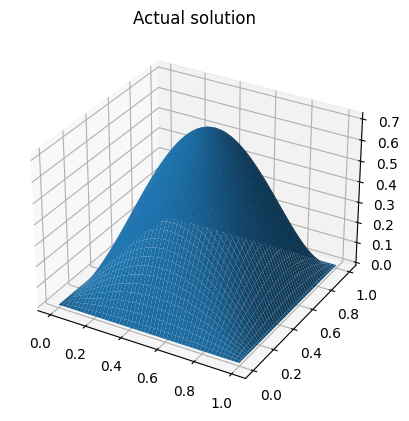

In [5]:
plot_graph(actual_soln(0.01),'Actual solution')



  Epsilon : 0.1


Train Epoch: 0 	Loss: 33.60696792602539062500
Train Epoch: 0 	Loss: 29.20761871337890625000
Train Epoch: 0 	Loss: 18.77046775817871093750
Train Epoch: 0 	Loss: 21.61121940612792968750

After Epoch 0, 	 Actual solution loss: 0.00533440353159079367



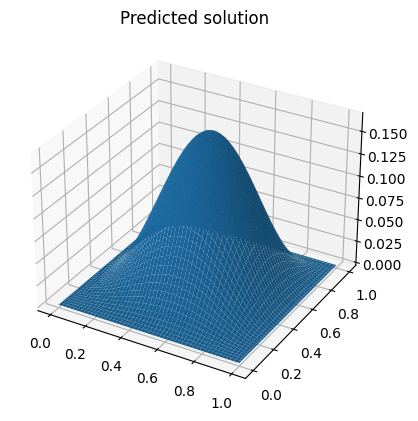

Train Epoch: 1 	Loss: 18.91849517822265625000
Train Epoch: 1 	Loss: 19.35195541381835937500
Train Epoch: 1 	Loss: 11.54371070861816406250
Train Epoch: 1 	Loss: 10.18772506713867187500

After Epoch 1, 	 Actual solution loss: 0.00254566256031837869



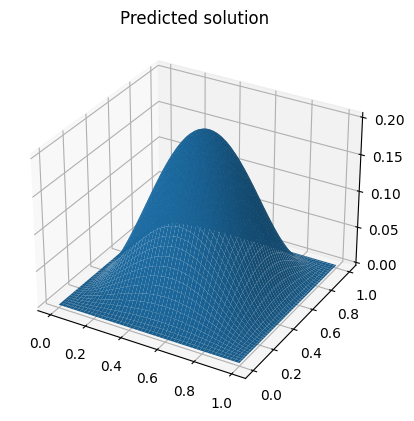

Train Epoch: 2 	Loss: 10.69276618957519531250
Train Epoch: 2 	Loss: 8.48939323425292968750
Train Epoch: 2 	Loss: 2.66655349731445312500
Train Epoch: 2 	Loss: 0.74116361141204833984

After Epoch 2, 	 Actual solution loss: 0.00004044936099644453



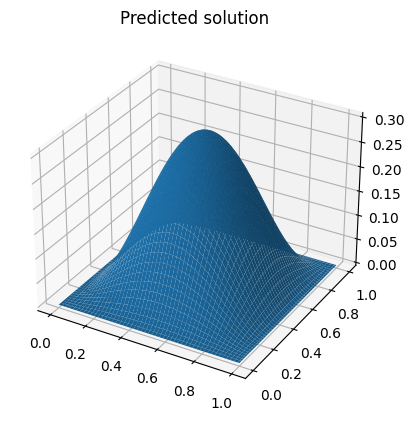

Train Epoch: 3 	Loss: 0.48152637481689453125
Train Epoch: 3 	Loss: 0.26764148473739624023
Train Epoch: 3 	Loss: 0.08003842085599899292
Train Epoch: 3 	Loss: 0.10491212457418441772

After Epoch 3, 	 Actual solution loss: 0.00001050707320018945



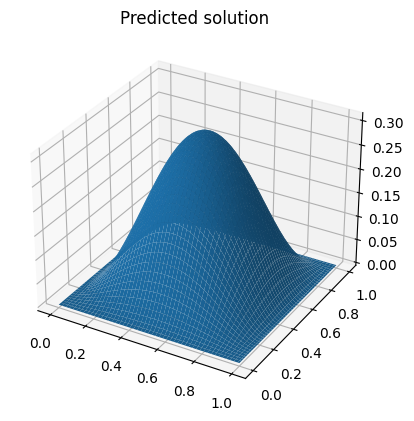

Train Epoch: 4 	Loss: 0.06494033336639404297
Train Epoch: 4 	Loss: 0.02767183445394039154
Train Epoch: 4 	Loss: 0.02346761338412761688
Train Epoch: 4 	Loss: 0.03908058255910873413

After Epoch 4, 	 Actual solution loss: 0.00000447764034914171



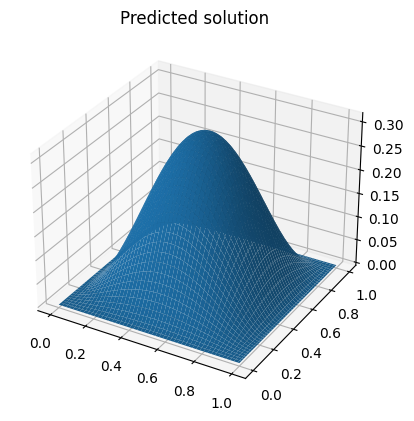

Train Epoch: 5 	Loss: 0.04399158805608749390
Train Epoch: 5 	Loss: 0.02592768333852291107
Train Epoch: 5 	Loss: 0.01085104607045650482
Train Epoch: 5 	Loss: 0.01884624548256397247

After Epoch 5, 	 Actual solution loss: 0.00000015578247704845



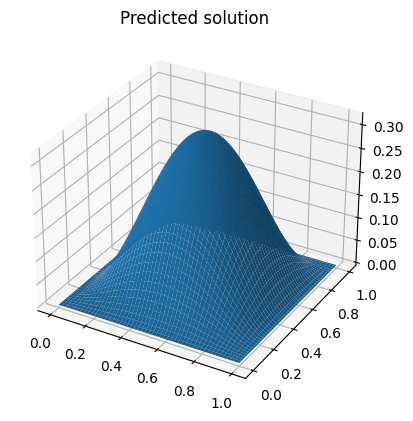

Train Epoch: 6 	Loss: 0.03204464539885520935
Train Epoch: 6 	Loss: 0.00785885285586118698
Train Epoch: 6 	Loss: 0.00551630184054374695
Train Epoch: 6 	Loss: 0.00765872374176979065

After Epoch 6, 	 Actual solution loss: 0.00000066675056640483



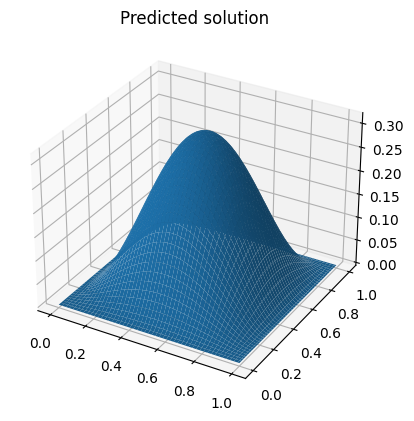

Train Epoch: 7 	Loss: 0.00649184733629226685
Train Epoch: 7 	Loss: 0.00422313716262578964
Train Epoch: 7 	Loss: 0.00567965395748615265
Train Epoch: 7 	Loss: 0.00291479658335447311

After Epoch 7, 	 Actual solution loss: 0.00000003629256384255



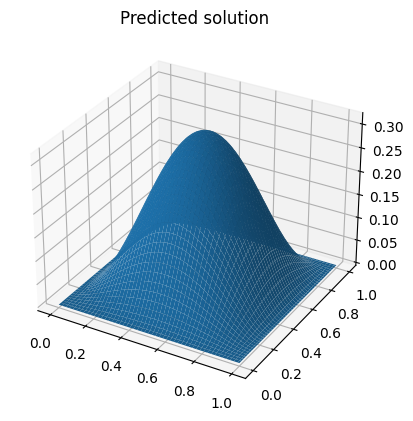

Train Epoch: 8 	Loss: 0.00589530915021896362
Train Epoch: 8 	Loss: 0.00271028326824307442
Train Epoch: 8 	Loss: 0.00401737447828054428
Train Epoch: 8 	Loss: 0.00399719132110476494

After Epoch 8, 	 Actual solution loss: 0.00000009974462976079



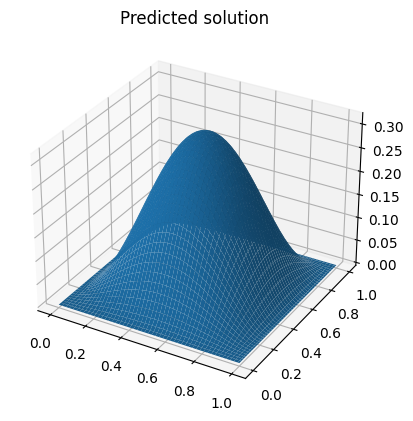

Train Epoch: 9 	Loss: 0.00247677927836775780
Train Epoch: 9 	Loss: 0.00928924791514873505
Train Epoch: 9 	Loss: 0.00803853105753660202
Train Epoch: 9 	Loss: 0.01165737025439739227

After Epoch 9, 	 Actual solution loss: 0.00000000976838827074



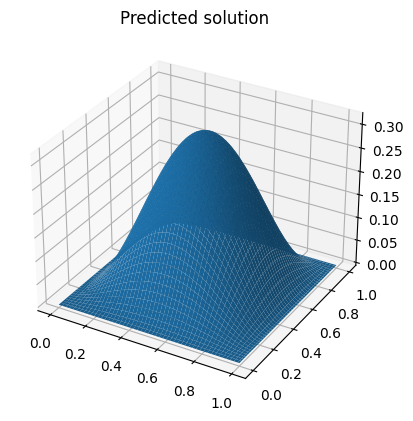

Train Epoch: 10 	Loss: 0.00295474007725715637
Train Epoch: 10 	Loss: 0.00247161369770765305
Train Epoch: 10 	Loss: 0.00476346118375658989
Train Epoch: 10 	Loss: 0.01180223282426595688

After Epoch 10, 	 Actual solution loss: 0.00000026639060113491



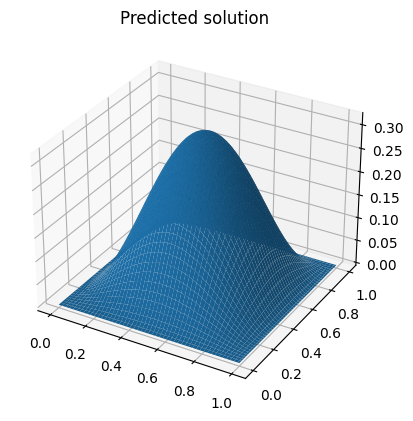

Train Epoch: 11 	Loss: 0.00938780419528484344
Train Epoch: 11 	Loss: 0.00228729285299777985
Train Epoch: 11 	Loss: 0.00596894184127449989
Train Epoch: 11 	Loss: 0.00234086927957832813

After Epoch 11, 	 Actual solution loss: 0.00000002907550302761



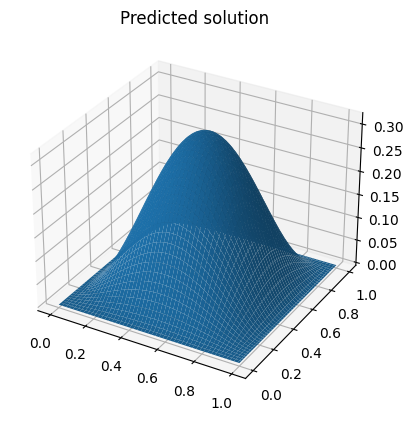

Train Epoch: 12 	Loss: 0.00450002495199441910
Train Epoch: 12 	Loss: 0.01195528917014598846
Train Epoch: 12 	Loss: 0.00363814807496964931
Train Epoch: 12 	Loss: 0.02061960101127624512

After Epoch 12, 	 Actual solution loss: 0.00000020567818928003



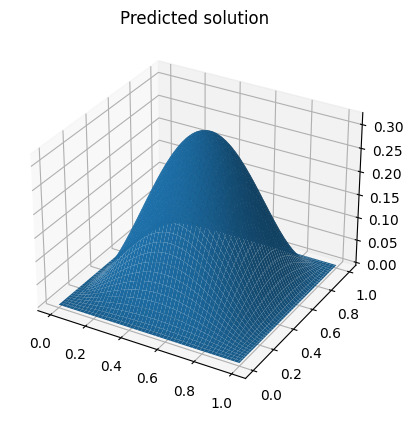

Train Epoch: 13 	Loss: 0.00227196584455668926
Train Epoch: 13 	Loss: 0.00615088641643524170
Train Epoch: 13 	Loss: 0.01869471371173858643
Train Epoch: 13 	Loss: 0.00582541432231664658

After Epoch 13, 	 Actual solution loss: 0.00000010884435772547



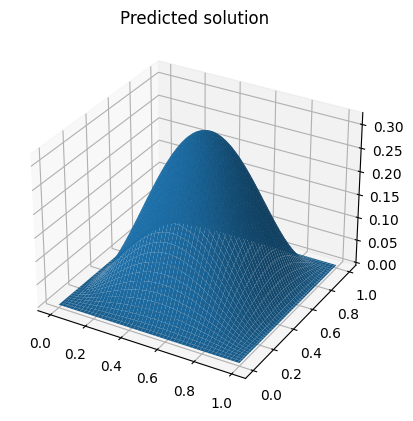

Train Epoch: 14 	Loss: 0.00256531708873808384
Train Epoch: 14 	Loss: 0.00269613880664110184
Train Epoch: 14 	Loss: 0.01549921464174985886
Train Epoch: 14 	Loss: 0.00971253030002117157

After Epoch 14, 	 Actual solution loss: 0.00000029575887304902



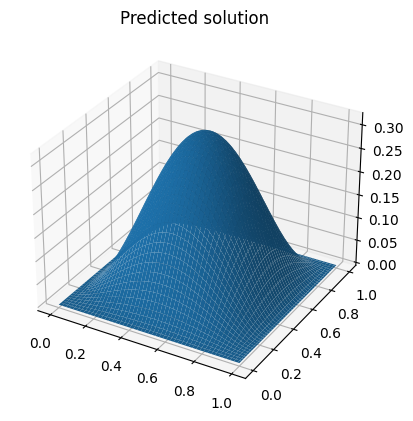

Train Epoch: 15 	Loss: 0.00428429292514920235
Train Epoch: 15 	Loss: 0.00122139288578182459
Train Epoch: 15 	Loss: 0.00049330468755215406
Train Epoch: 15 	Loss: 0.00076281582005321980

After Epoch 15, 	 Actual solution loss: 0.00000001098444239644



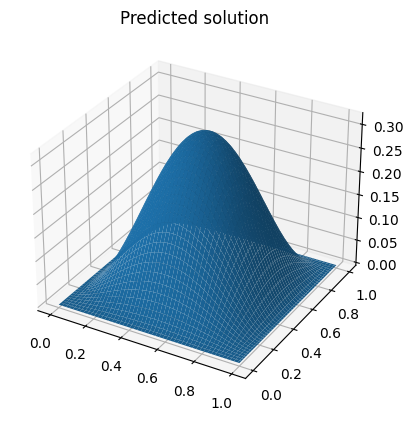

Train Epoch: 16 	Loss: 0.00273106433451175690
Train Epoch: 16 	Loss: 0.00137698662001639605
Train Epoch: 16 	Loss: 0.00292042503133416176
Train Epoch: 16 	Loss: 0.00172682676929980516

After Epoch 16, 	 Actual solution loss: 0.00000002710634096905



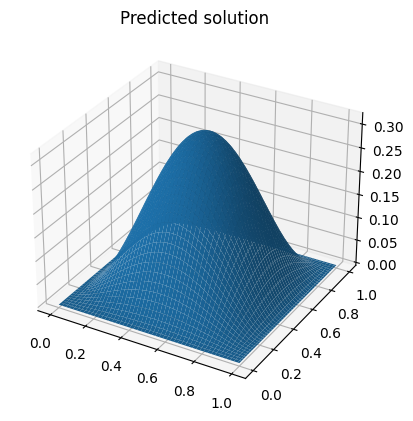

Train Epoch: 17 	Loss: 0.00114238844253122807
Train Epoch: 17 	Loss: 0.00206663436256349087
Train Epoch: 17 	Loss: 0.00233665574342012405
Train Epoch: 17 	Loss: 0.00163757975678890944

After Epoch 17, 	 Actual solution loss: 0.00000344052714732706



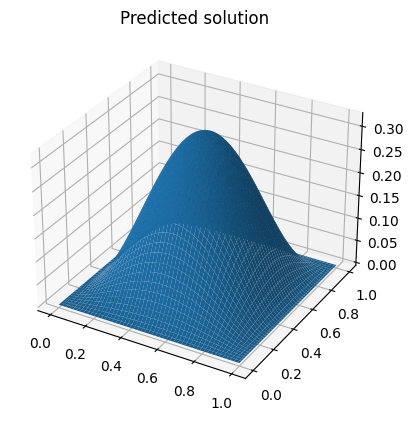

Train Epoch: 18 	Loss: 0.00998270418494939804
Train Epoch: 18 	Loss: 0.02107743918895721436
Train Epoch: 18 	Loss: 0.01054619811475276947
Train Epoch: 18 	Loss: 0.00879781506955623627

After Epoch 18, 	 Actual solution loss: 0.00000012511098137986



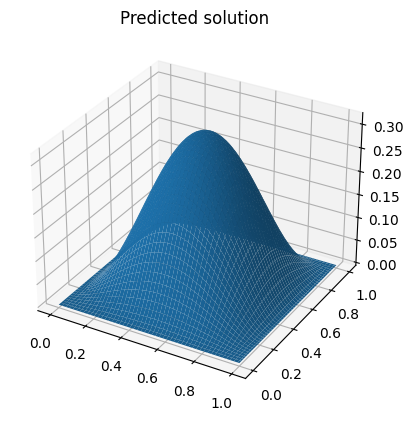

Train Epoch: 19 	Loss: 0.00542711233720183372
Train Epoch: 19 	Loss: 0.00108659418765455484
Train Epoch: 19 	Loss: 0.00100744829978793859
Train Epoch: 19 	Loss: 0.00059560342924669385

After Epoch 19, 	 Actual solution loss: 0.00000001598044843313



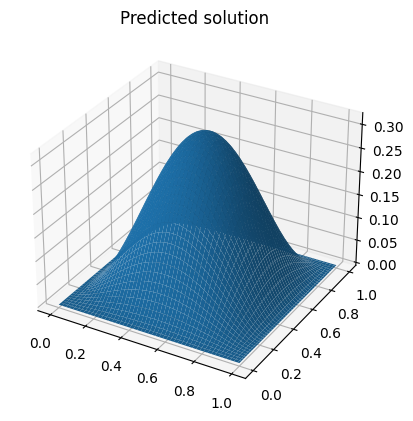

Train Epoch: 20 	Loss: 0.00038950817543081939
Train Epoch: 20 	Loss: 0.00027463678270578384
Train Epoch: 20 	Loss: 0.00031421525636687875
Train Epoch: 20 	Loss: 0.01701895706355571747

After Epoch 20, 	 Actual solution loss: 0.00000122721418868984



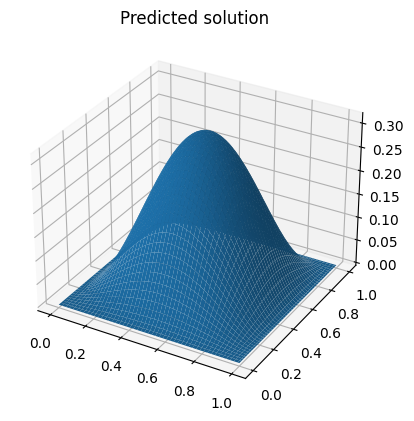

Train Epoch: 21 	Loss: 0.01048247609287500381
Train Epoch: 21 	Loss: 0.00870684906840324402
Train Epoch: 21 	Loss: 0.00273553305305540562
Train Epoch: 21 	Loss: 0.00512065133079886436

After Epoch 21, 	 Actual solution loss: 0.00000036085241755518



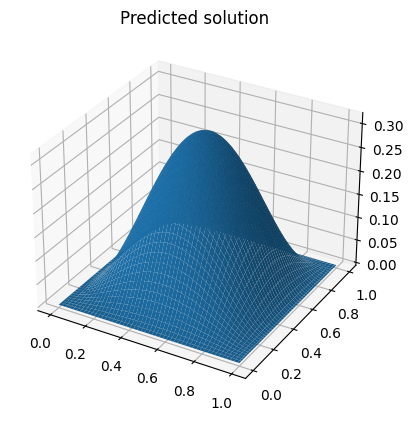

Train Epoch: 22 	Loss: 0.00132784503512084484
Train Epoch: 22 	Loss: 0.00062262773280963302
Train Epoch: 22 	Loss: 0.00020757787569891661
Train Epoch: 22 	Loss: 0.00138035998679697514

After Epoch 22, 	 Actual solution loss: 0.00000026730995817206



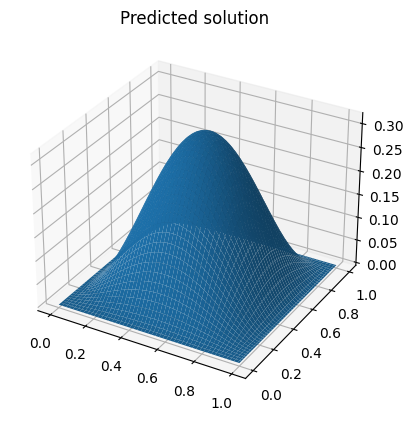

Train Epoch: 23 	Loss: 0.00241603469476103783
Train Epoch: 23 	Loss: 0.00140744622331112623
Train Epoch: 23 	Loss: 0.00918599218130111694
Train Epoch: 23 	Loss: 0.00743823871016502380

After Epoch 23, 	 Actual solution loss: 0.00000000476675275863



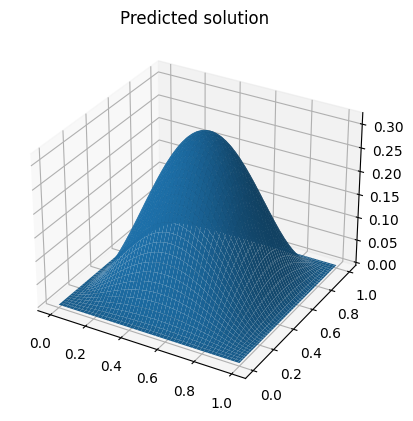

Train Epoch: 24 	Loss: 0.00071192800533026457
Train Epoch: 24 	Loss: 0.00232750200666487217
Train Epoch: 24 	Loss: 0.00272484938614070415
Train Epoch: 24 	Loss: 0.01821701787412166595

After Epoch 24, 	 Actual solution loss: 0.00000008853050129758



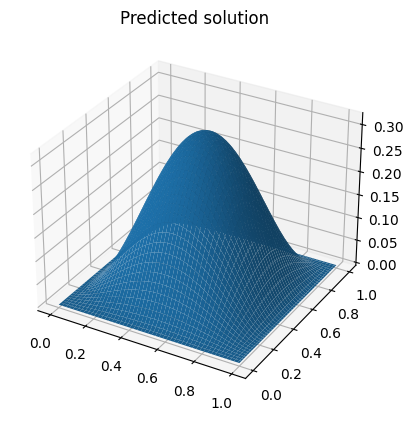

Train Epoch: 25 	Loss: 0.00324538908898830414
Train Epoch: 25 	Loss: 0.00157271232455968857
Train Epoch: 25 	Loss: 0.00446926755830645561
Train Epoch: 25 	Loss: 0.00191314704716205597

After Epoch 25, 	 Actual solution loss: 0.00000006994908635843



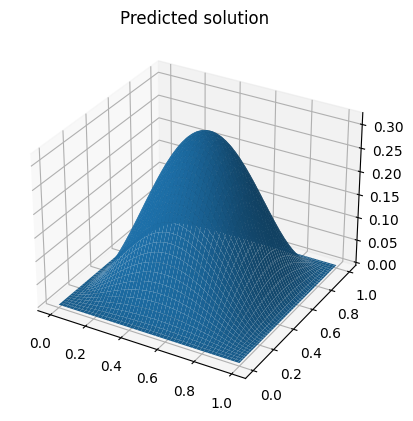

Train Epoch: 26 	Loss: 0.00103922933340072632
Train Epoch: 26 	Loss: 0.00032227407791651785
Train Epoch: 26 	Loss: 0.00053649855544790626
Train Epoch: 26 	Loss: 0.00036857719533145428

After Epoch 26, 	 Actual solution loss: 0.00000000257626093849



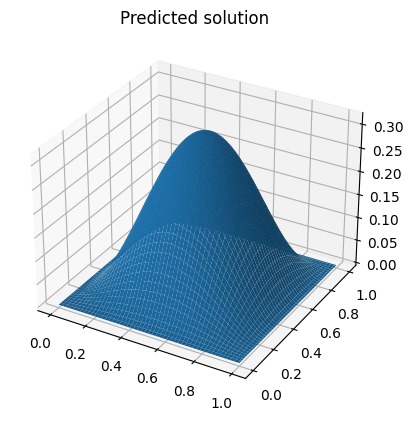

Train Epoch: 27 	Loss: 0.00027185204089619219
Train Epoch: 27 	Loss: 0.00035963821574114263
Train Epoch: 27 	Loss: 0.01357092056423425674
Train Epoch: 27 	Loss: 0.00600231345742940903

After Epoch 27, 	 Actual solution loss: 0.00000018808206782221



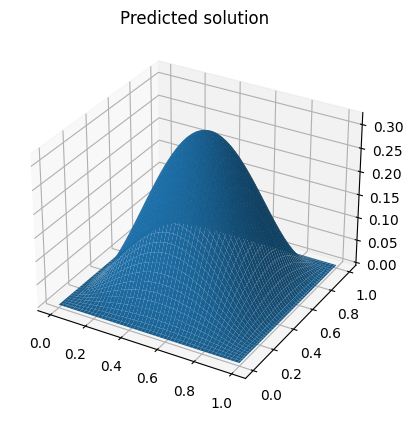

Train Epoch: 28 	Loss: 0.00315397931262850761
Train Epoch: 28 	Loss: 0.00092969107208773494
Train Epoch: 28 	Loss: 0.00155175570398569107
Train Epoch: 28 	Loss: 0.00232010590843856335

After Epoch 28, 	 Actual solution loss: 0.00000023814864915830



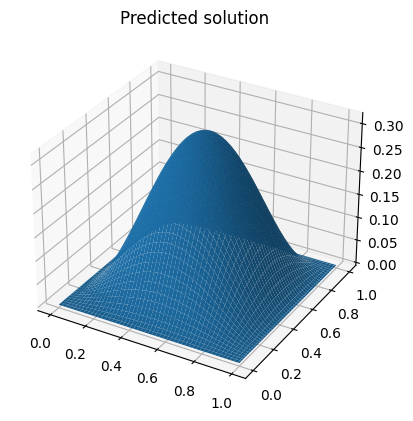

Train Epoch: 29 	Loss: 0.00181719008833169937
Train Epoch: 29 	Loss: 0.00080797082046046853
Train Epoch: 29 	Loss: 0.00168689910788089037
Train Epoch: 29 	Loss: 0.00034516258165240288

After Epoch 29, 	 Actual solution loss: 0.00000040469169626284



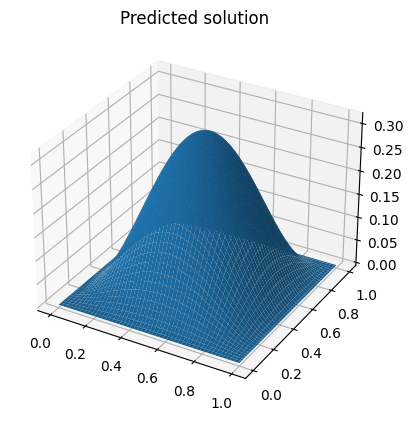

Train Epoch: 30 	Loss: 0.00121725862845778465
Train Epoch: 30 	Loss: 0.00014255024143494666
Train Epoch: 30 	Loss: 0.00010665864101611078
Train Epoch: 30 	Loss: 0.00019127818814013153

After Epoch 30, 	 Actual solution loss: 0.00000000083058356843



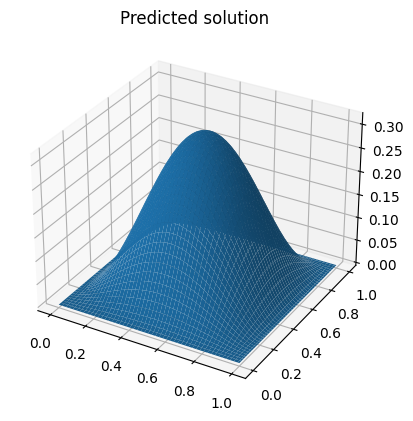

Train Epoch: 31 	Loss: 0.00008421782695222646
Train Epoch: 31 	Loss: 0.00008612733654445037
Train Epoch: 31 	Loss: 0.00012572541891131550
Train Epoch: 31 	Loss: 0.00008570420322939754

After Epoch 31, 	 Actual solution loss: 0.00000000228549316703



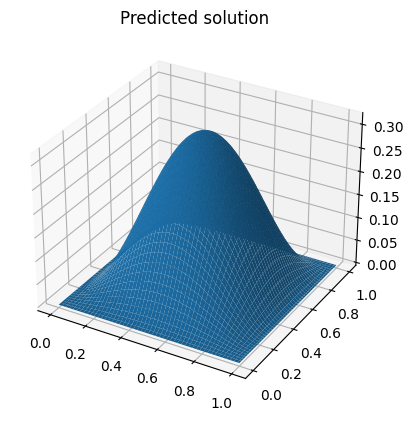

Train Epoch: 32 	Loss: 0.00008101700223051012
Train Epoch: 32 	Loss: 0.00009031558147398755
Train Epoch: 32 	Loss: 0.00006223100353963673
Train Epoch: 32 	Loss: 0.00012149268150096759

After Epoch 32, 	 Actual solution loss: 0.00000000014167346838



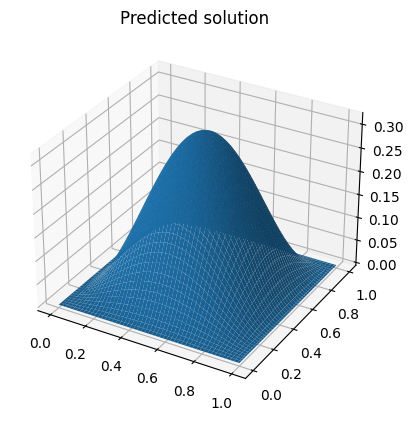

Train Epoch: 33 	Loss: 0.00007726027979515493
Train Epoch: 33 	Loss: 0.00009335824142908677
Train Epoch: 33 	Loss: 0.00006955037679290399
Train Epoch: 33 	Loss: 0.00008423317194683477

After Epoch 33, 	 Actual solution loss: 0.00000000110255801114



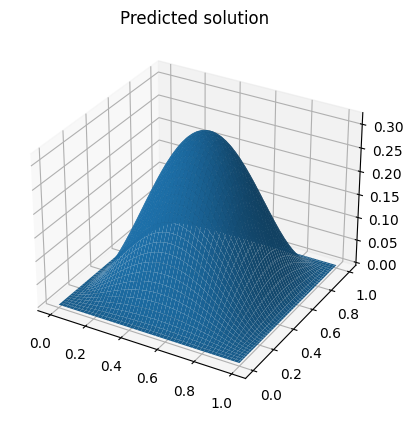

Train Epoch: 34 	Loss: 0.00007624285353813320
Train Epoch: 34 	Loss: 0.00022464523499365896
Train Epoch: 34 	Loss: 0.00006245606346055865
Train Epoch: 34 	Loss: 0.00008830882143229246

After Epoch 34, 	 Actual solution loss: 0.00000000227855210148



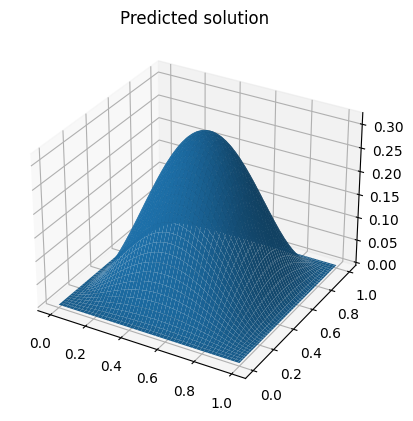

Train Epoch: 35 	Loss: 0.00008447017899015918
Train Epoch: 35 	Loss: 0.00006412483344320208
Train Epoch: 35 	Loss: 0.00010305645264452323
Train Epoch: 35 	Loss: 0.00008865164272719994

After Epoch 35, 	 Actual solution loss: 0.00000000022444654009



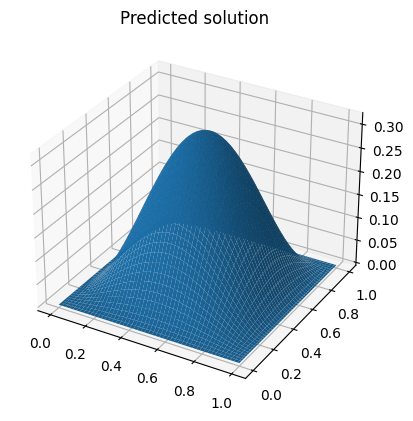

Train Epoch: 36 	Loss: 0.00005879801756236702
Train Epoch: 36 	Loss: 0.00007176159124355763
Train Epoch: 36 	Loss: 0.00007491969154216349
Train Epoch: 36 	Loss: 0.00007412012200802565

After Epoch 36, 	 Actual solution loss: 0.00000000310024831909



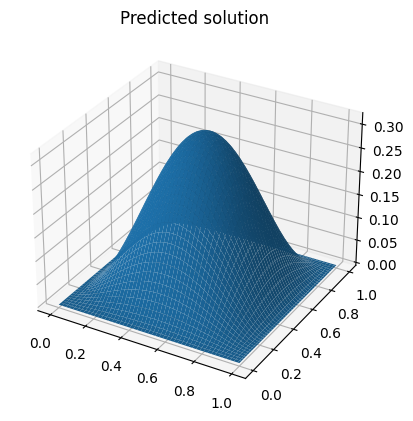

Train Epoch: 37 	Loss: 0.00006423283775802702
Train Epoch: 37 	Loss: 0.00008713366696611047
Train Epoch: 37 	Loss: 0.00009129421232501045
Train Epoch: 37 	Loss: 0.00008601041918154806

After Epoch 37, 	 Actual solution loss: 0.00000000046532686567



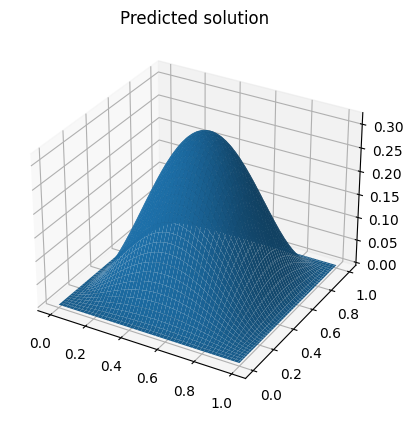

Train Epoch: 38 	Loss: 0.00013473106082528830
Train Epoch: 38 	Loss: 0.00007302000449271873
Train Epoch: 38 	Loss: 0.00008061344851739705
Train Epoch: 38 	Loss: 0.00007351474778261036

After Epoch 38, 	 Actual solution loss: 0.00000000006941453672



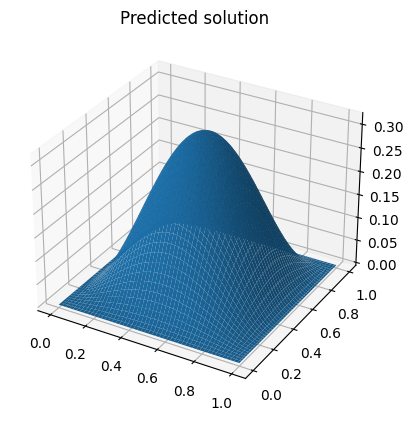

Train Epoch: 39 	Loss: 0.00026380340568721294
Train Epoch: 39 	Loss: 0.00010371455573476851
Train Epoch: 39 	Loss: 0.00008446246647508815
Train Epoch: 39 	Loss: 0.00009621131903259084

After Epoch 39, 	 Actual solution loss: 0.00000000076803049427



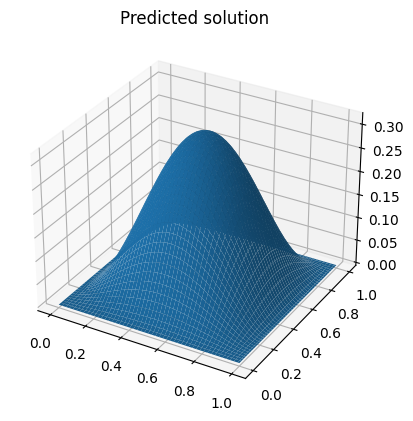

Train Epoch: 40 	Loss: 0.00007979483052622527
Train Epoch: 40 	Loss: 0.00010810980165842921
Train Epoch: 40 	Loss: 0.00007266309694387019
Train Epoch: 40 	Loss: 0.00008208090730477124

After Epoch 40, 	 Actual solution loss: 0.00000000018916777760



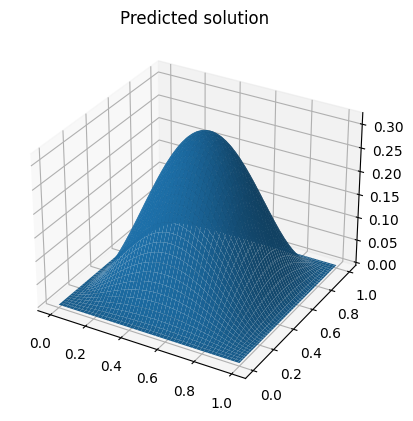

Train Epoch: 41 	Loss: 0.00005708078242605552
Train Epoch: 41 	Loss: 0.00024533021496608853
Train Epoch: 41 	Loss: 0.00006980589387239888
Train Epoch: 41 	Loss: 0.00008353828161489218

After Epoch 41, 	 Actual solution loss: 0.00000000023702328883



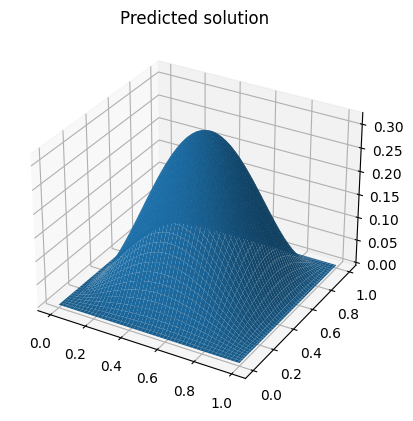

Train Epoch: 42 	Loss: 0.00010809995001181960
Train Epoch: 42 	Loss: 0.00007345642370637506
Train Epoch: 42 	Loss: 0.00012596503074746579
Train Epoch: 42 	Loss: 0.00006432931695599109

After Epoch 42, 	 Actual solution loss: 0.00000000031574906662



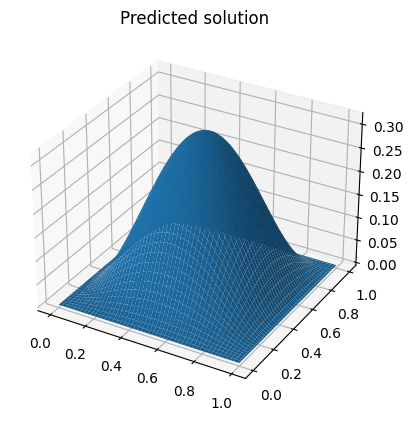

Train Epoch: 43 	Loss: 0.00006148430838948116
Train Epoch: 43 	Loss: 0.00023877987405285239
Train Epoch: 43 	Loss: 0.00008613453974248841
Train Epoch: 43 	Loss: 0.00006535919237649068

After Epoch 43, 	 Actual solution loss: 0.00000000095856348720



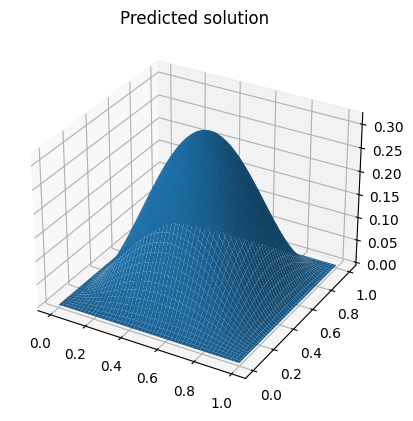

Train Epoch: 44 	Loss: 0.00006208795821294188
Train Epoch: 44 	Loss: 0.00005231409522821195
Train Epoch: 44 	Loss: 0.00007441054913215339
Train Epoch: 44 	Loss: 0.00019858454470522702

After Epoch 44, 	 Actual solution loss: 0.00000000045890209331



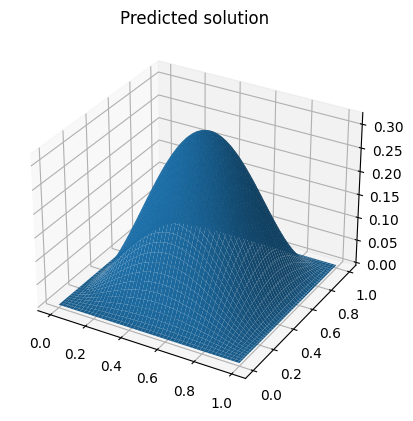

Train Epoch: 45 	Loss: 0.00006884476169943810
Train Epoch: 45 	Loss: 0.00005408809374785051
Train Epoch: 45 	Loss: 0.00008186380728147924
Train Epoch: 45 	Loss: 0.00019440904725342989

After Epoch 45, 	 Actual solution loss: 0.00000000049310938473



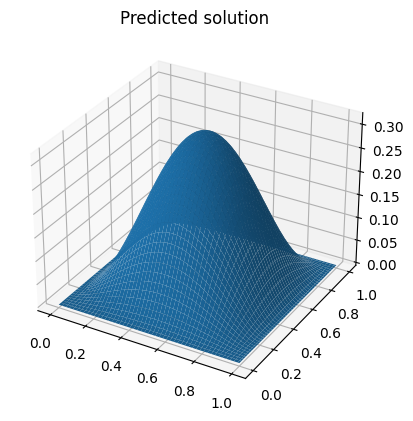

Train Epoch: 46 	Loss: 0.00009584687359165400
Train Epoch: 46 	Loss: 0.00010595453932182863
Train Epoch: 46 	Loss: 0.00017559932894073427
Train Epoch: 46 	Loss: 0.00007116593042155728

After Epoch 46, 	 Actual solution loss: 0.00000000110252732857



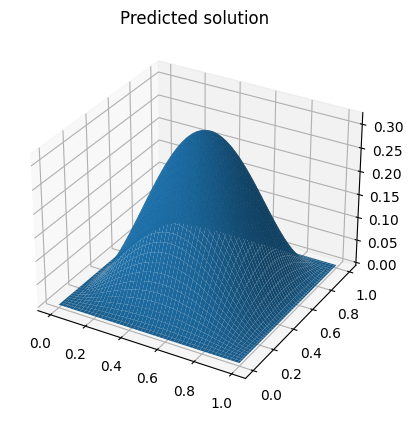

Train Epoch: 47 	Loss: 0.00006930593372089788
Train Epoch: 47 	Loss: 0.00006021797162247822
Train Epoch: 47 	Loss: 0.00005869023880222812
Train Epoch: 47 	Loss: 0.00006418357952497900

After Epoch 47, 	 Actual solution loss: 0.00000000050204163856



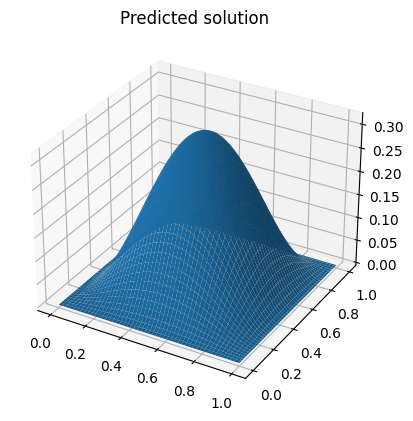

Train Epoch: 48 	Loss: 0.00010245920566376299
Train Epoch: 48 	Loss: 0.00006738422962371260
Train Epoch: 48 	Loss: 0.00016728551418054849
Train Epoch: 48 	Loss: 0.00005555585084948689

After Epoch 48, 	 Actual solution loss: 0.00000000071726457804



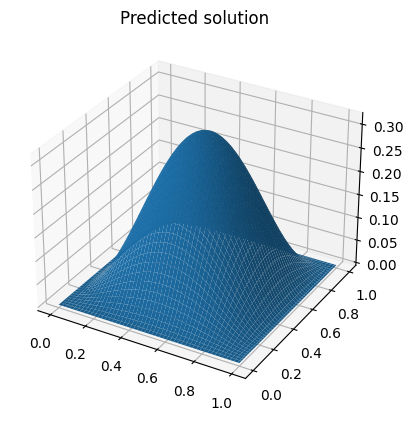

Train Epoch: 49 	Loss: 0.00008148578490363434
Train Epoch: 49 	Loss: 0.00005611280721495859
Train Epoch: 49 	Loss: 0.00011136717512272298
Train Epoch: 49 	Loss: 0.00008352941222256050

After Epoch 49, 	 Actual solution loss: 0.00000000035951569964



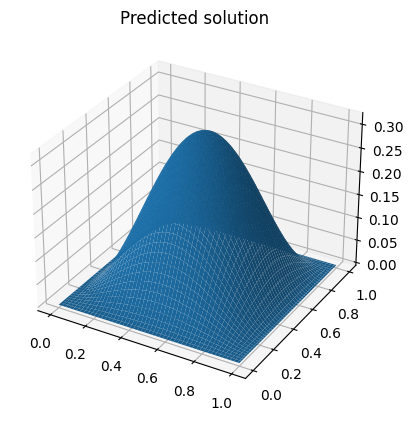

Time elapsed =  1371.8818528652191


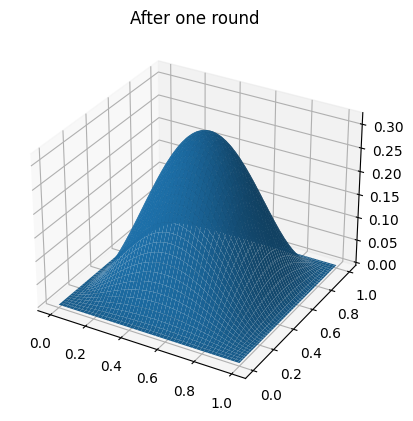



  Epsilon : 0.05


Train Epoch: 0 	Loss: 28.23163032531738281250
Train Epoch: 0 	Loss: 17.29900741577148437500
Train Epoch: 0 	Loss: 15.89946556091308593750
Train Epoch: 0 	Loss: 12.51771736145019531250

After Epoch 0, 	 Actual solution loss: 0.00493928234434373465



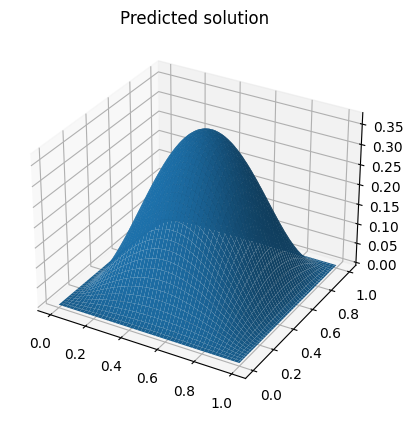

Train Epoch: 1 	Loss: 8.13220787048339843750
Train Epoch: 1 	Loss: 5.72566986083984375000
Train Epoch: 1 	Loss: 4.71036720275878906250
Train Epoch: 1 	Loss: 3.97721529006958007812

After Epoch 1, 	 Actual solution loss: 0.00237276142552328038



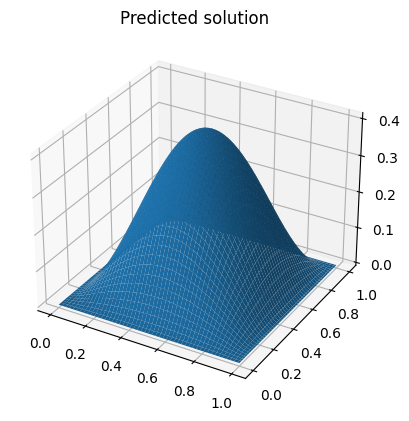

Train Epoch: 2 	Loss: 3.71096158027648925781
Train Epoch: 2 	Loss: 3.63375711441040039062
Train Epoch: 2 	Loss: 4.47653913497924804688
Train Epoch: 2 	Loss: 1.89429795742034912109

After Epoch 2, 	 Actual solution loss: 0.00043203092820982245



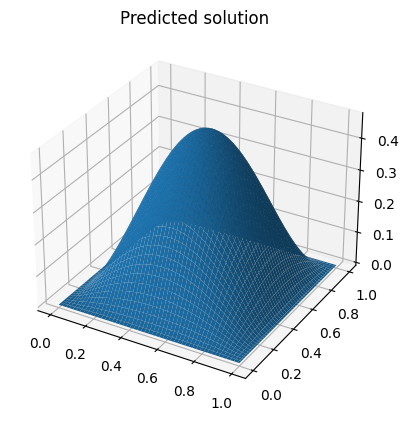

Train Epoch: 3 	Loss: 1.76613008975982666016
Train Epoch: 3 	Loss: 1.70231223106384277344
Train Epoch: 3 	Loss: 1.92292189598083496094
Train Epoch: 3 	Loss: 1.73338127136230468750

After Epoch 3, 	 Actual solution loss: 0.00016548933236896246



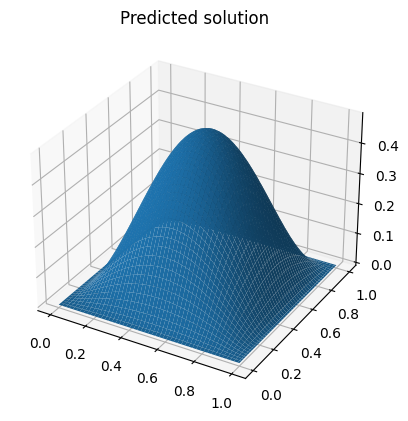

Train Epoch: 4 	Loss: 0.63254463672637939453
Train Epoch: 4 	Loss: 0.83501428365707397461
Train Epoch: 4 	Loss: 0.53996586799621582031
Train Epoch: 4 	Loss: 0.80752325057983398438

After Epoch 4, 	 Actual solution loss: 0.00000717079430066805



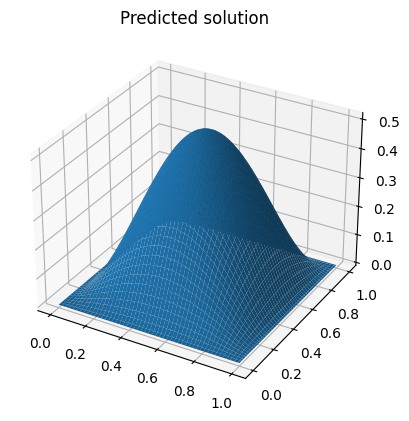

Train Epoch: 5 	Loss: 1.09345281124114990234
Train Epoch: 5 	Loss: 0.31541737914085388184
Train Epoch: 5 	Loss: 0.29345858097076416016
Train Epoch: 5 	Loss: 0.35783031582832336426

After Epoch 5, 	 Actual solution loss: 0.00000130791925044768



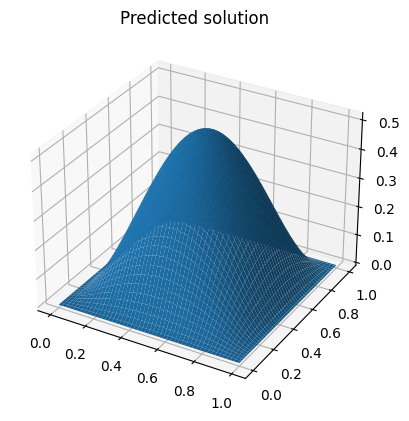

Train Epoch: 6 	Loss: 0.57799619436264038086
Train Epoch: 6 	Loss: 0.24142390489578247070
Train Epoch: 6 	Loss: 0.21846772730350494385
Train Epoch: 6 	Loss: 0.32823908329010009766

After Epoch 6, 	 Actual solution loss: 0.00003553210460761007



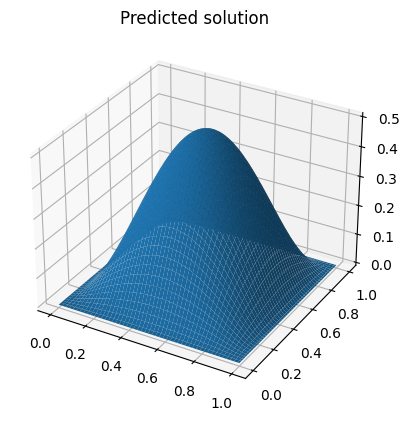

Train Epoch: 7 	Loss: 0.21241281926631927490
Train Epoch: 7 	Loss: 0.19815944135189056396
Train Epoch: 7 	Loss: 0.08132733404636383057
Train Epoch: 7 	Loss: 0.11414510011672973633

After Epoch 7, 	 Actual solution loss: 0.00002070753570480986



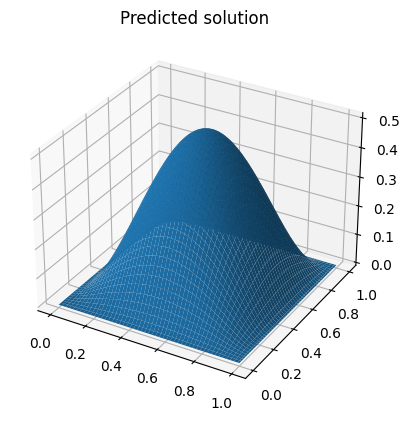

Train Epoch: 8 	Loss: 0.21657745540142059326
Train Epoch: 8 	Loss: 0.11147986352443695068
Train Epoch: 8 	Loss: 0.19403049349784851074
Train Epoch: 8 	Loss: 0.28147572278976440430

After Epoch 8, 	 Actual solution loss: 0.00000368398672929430



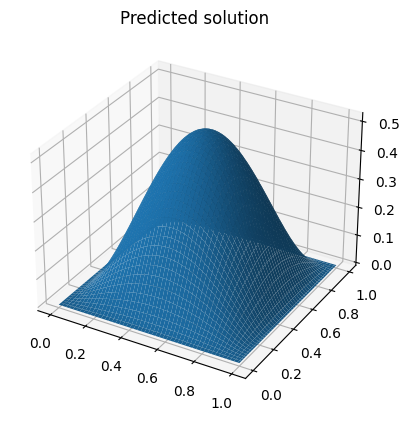

Train Epoch: 9 	Loss: 0.40604758262634277344
Train Epoch: 9 	Loss: 0.06815170496702194214
Train Epoch: 9 	Loss: 0.10735352337360382080
Train Epoch: 9 	Loss: 0.11645796895027160645

After Epoch 9, 	 Actual solution loss: 0.00000030722075248715



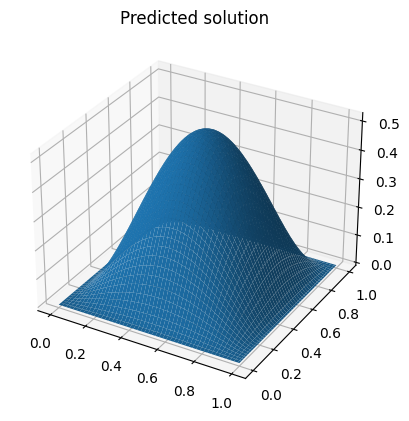

Train Epoch: 10 	Loss: 0.05585224926471710205
Train Epoch: 10 	Loss: 0.05365769565105438232
Train Epoch: 10 	Loss: 0.05670099332928657532
Train Epoch: 10 	Loss: 0.17501407861709594727

After Epoch 10, 	 Actual solution loss: 0.00000299789425001888



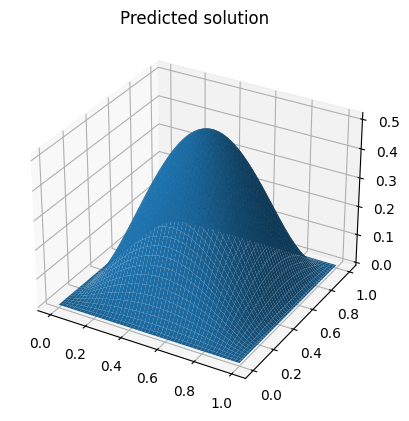

Train Epoch: 11 	Loss: 0.03750540316104888916
Train Epoch: 11 	Loss: 0.04229068011045455933
Train Epoch: 11 	Loss: 0.07697658985853195190
Train Epoch: 11 	Loss: 0.08809769153594970703

After Epoch 11, 	 Actual solution loss: 0.00000464281627600422



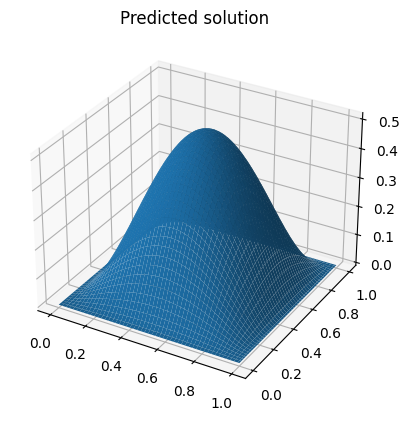

Train Epoch: 12 	Loss: 0.08823356777429580688
Train Epoch: 12 	Loss: 0.09134361892938613892
Train Epoch: 12 	Loss: 0.08756152540445327759
Train Epoch: 12 	Loss: 0.06492110341787338257

After Epoch 12, 	 Actual solution loss: 0.00000049255360053139



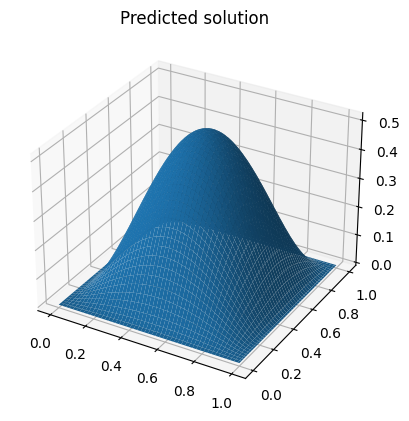

Train Epoch: 13 	Loss: 0.01951063610613346100
Train Epoch: 13 	Loss: 0.06929844617843627930
Train Epoch: 13 	Loss: 0.15032359957695007324
Train Epoch: 13 	Loss: 0.06713778525590896606

After Epoch 13, 	 Actual solution loss: 0.00000033149981544417



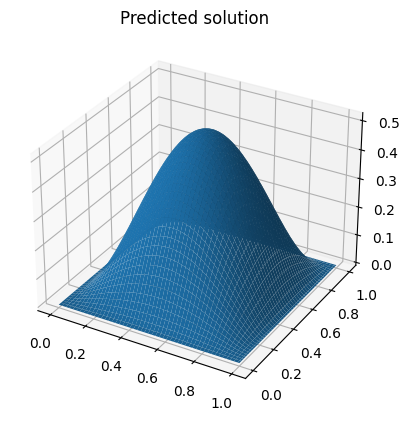

Train Epoch: 14 	Loss: 0.01539714634418487549
Train Epoch: 14 	Loss: 0.02669291570782661438
Train Epoch: 14 	Loss: 0.06313735246658325195
Train Epoch: 14 	Loss: 0.07899612933397293091

After Epoch 14, 	 Actual solution loss: 0.00000114980724980208



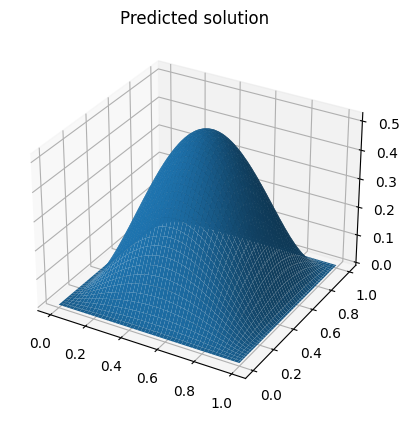

Train Epoch: 15 	Loss: 0.01380223501473665237
Train Epoch: 15 	Loss: 0.05675079300999641418
Train Epoch: 15 	Loss: 0.02927882596850395203
Train Epoch: 15 	Loss: 0.01891934685409069061

After Epoch 15, 	 Actual solution loss: 0.00000379482132684182



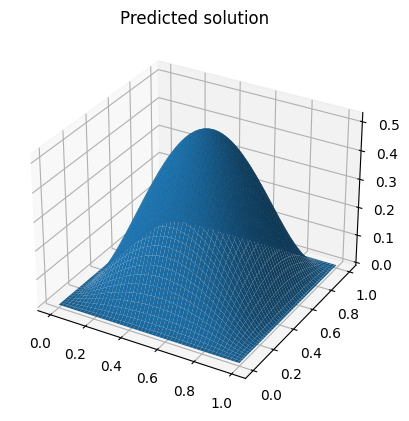

Train Epoch: 16 	Loss: 0.02894080430269241333
Train Epoch: 16 	Loss: 0.02115005627274513245
Train Epoch: 16 	Loss: 0.11125858128070831299
Train Epoch: 16 	Loss: 0.08005131781101226807

After Epoch 16, 	 Actual solution loss: 0.00006418029398293364



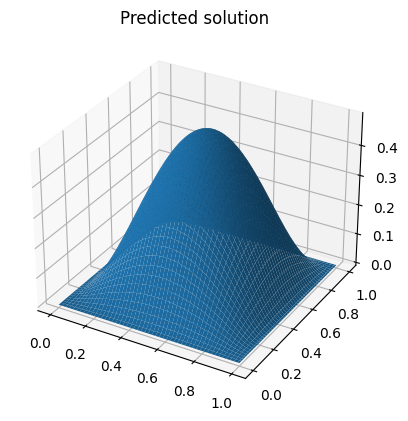

Train Epoch: 17 	Loss: 0.22300340235233306885
Train Epoch: 17 	Loss: 0.08296975493431091309
Train Epoch: 17 	Loss: 0.02766648121178150177
Train Epoch: 17 	Loss: 0.02495880424976348877

After Epoch 17, 	 Actual solution loss: 0.00000875950760696775



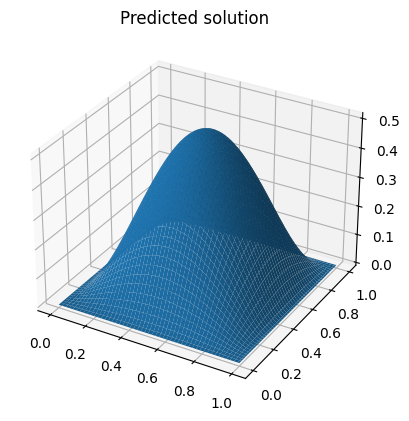

Train Epoch: 18 	Loss: 0.03782360628247261047
Train Epoch: 18 	Loss: 0.02027750201523303986
Train Epoch: 18 	Loss: 0.01223552599549293518
Train Epoch: 18 	Loss: 0.00799191743135452271

After Epoch 18, 	 Actual solution loss: 0.00000701666232109063



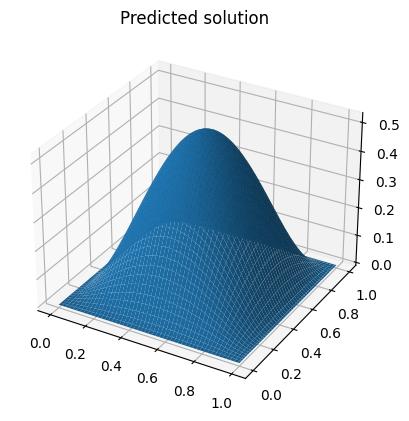

Train Epoch: 19 	Loss: 0.02540752291679382324
Train Epoch: 19 	Loss: 0.02364189736545085907
Train Epoch: 19 	Loss: 0.01262491196393966675
Train Epoch: 19 	Loss: 0.01110068522393703461

After Epoch 19, 	 Actual solution loss: 0.00000244215472723861



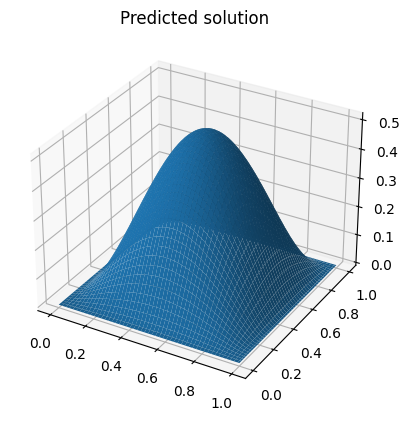

Train Epoch: 20 	Loss: 0.03718240931630134583
Train Epoch: 20 	Loss: 0.05796399340033531189
Train Epoch: 20 	Loss: 0.07278540730476379395
Train Epoch: 20 	Loss: 0.04376579076051712036

After Epoch 20, 	 Actual solution loss: 0.00000066070314880571



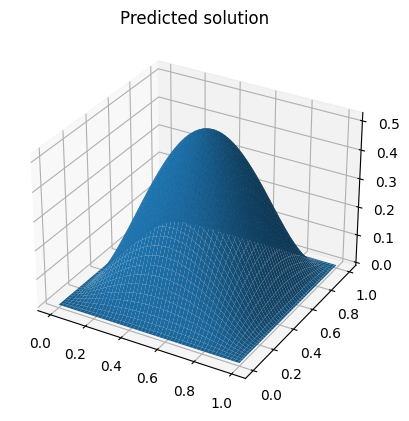

Train Epoch: 21 	Loss: 0.01705442555248737335
Train Epoch: 21 	Loss: 0.01415265537798404694
Train Epoch: 21 	Loss: 0.01583553478121757507
Train Epoch: 21 	Loss: 0.01715909503400325775

After Epoch 21, 	 Actual solution loss: 0.00001276472982493063



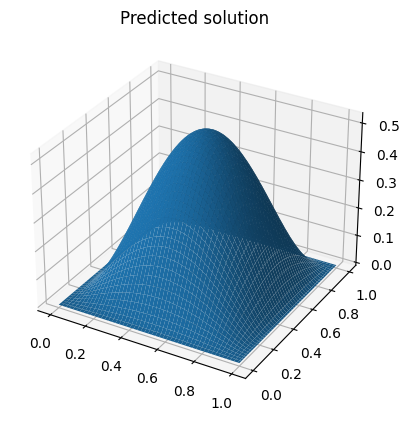

Train Epoch: 22 	Loss: 0.05321253463625907898
Train Epoch: 22 	Loss: 0.07309325784444808960
Train Epoch: 22 	Loss: 0.01210458949208259583
Train Epoch: 22 	Loss: 0.02646067366003990173

After Epoch 22, 	 Actual solution loss: 0.00000065044882546644



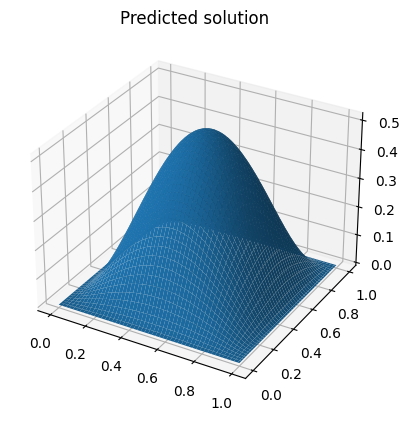

Train Epoch: 23 	Loss: 0.03673094511032104492
Train Epoch: 23 	Loss: 0.01326835714280605316
Train Epoch: 23 	Loss: 0.02360300533473491669
Train Epoch: 23 	Loss: 0.03049797751009464264

After Epoch 23, 	 Actual solution loss: 0.00000976617885782241



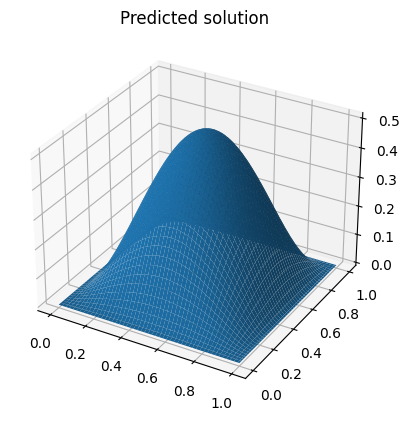

Train Epoch: 24 	Loss: 0.14636051654815673828
Train Epoch: 24 	Loss: 0.03232280910015106201
Train Epoch: 24 	Loss: 0.02290237322449684143
Train Epoch: 24 	Loss: 0.01555293053388595581

After Epoch 24, 	 Actual solution loss: 0.00000145860162687045



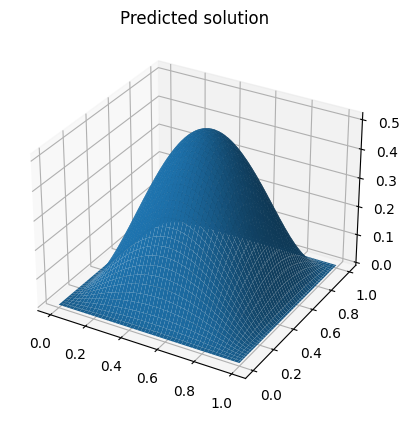

Train Epoch: 25 	Loss: 0.03973472863435745239
Train Epoch: 25 	Loss: 0.01388113945722579956
Train Epoch: 25 	Loss: 0.01214369013905525208
Train Epoch: 25 	Loss: 0.02033678442239761353

After Epoch 25, 	 Actual solution loss: 0.00000063853569573771



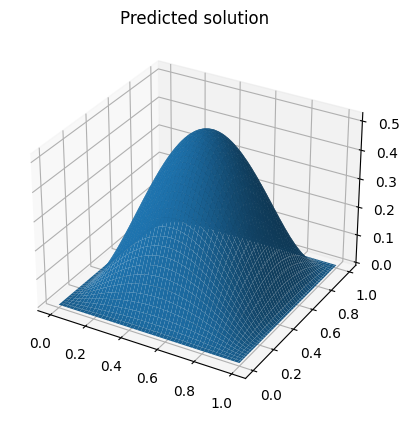

Train Epoch: 26 	Loss: 0.00844215601682662964
Train Epoch: 26 	Loss: 0.02627002261579036713
Train Epoch: 26 	Loss: 0.07122000306844711304
Train Epoch: 26 	Loss: 0.05761416628956794739

After Epoch 26, 	 Actual solution loss: 0.00000042220705681324



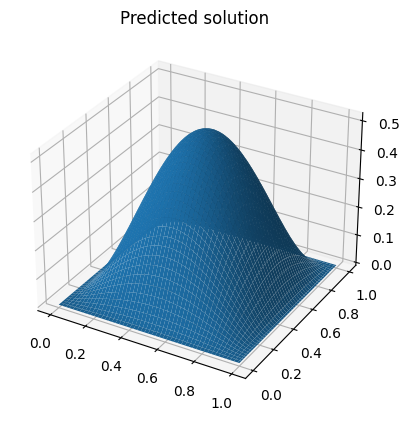

Train Epoch: 27 	Loss: 0.03059293702244758606
Train Epoch: 27 	Loss: 0.04663380607962608337
Train Epoch: 27 	Loss: 0.02332575060427188873
Train Epoch: 27 	Loss: 0.00898238178342580795

After Epoch 27, 	 Actual solution loss: 0.00000061195237156162



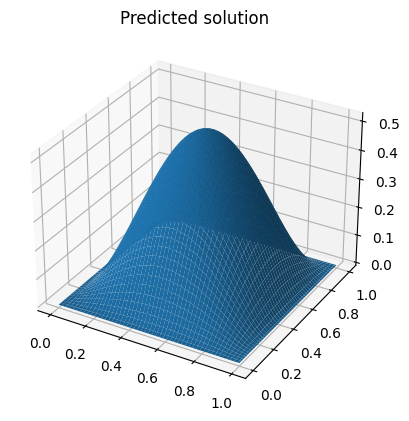

Train Epoch: 28 	Loss: 0.00998832937330007553
Train Epoch: 28 	Loss: 0.00497542694211006165
Train Epoch: 28 	Loss: 0.01964005455374717712
Train Epoch: 28 	Loss: 0.01798640005290508270

After Epoch 28, 	 Actual solution loss: 0.00000561245509645760



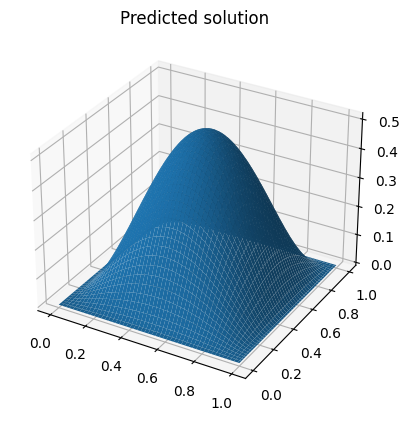

Train Epoch: 29 	Loss: 0.04794691875576972961
Train Epoch: 29 	Loss: 0.04809110239148139954
Train Epoch: 29 	Loss: 0.01093333587050437927
Train Epoch: 29 	Loss: 0.02608519792556762695

After Epoch 29, 	 Actual solution loss: 0.00000321629243530218



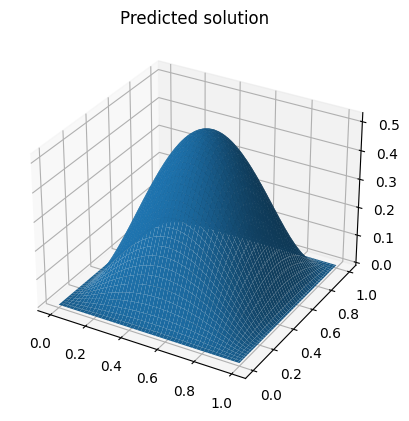

Train Epoch: 30 	Loss: 0.02314339578151702881
Train Epoch: 30 	Loss: 0.01327538769692182541
Train Epoch: 30 	Loss: 0.00308798369951546192
Train Epoch: 30 	Loss: 0.00604204600676894188

After Epoch 30, 	 Actual solution loss: 0.00000000280659779412



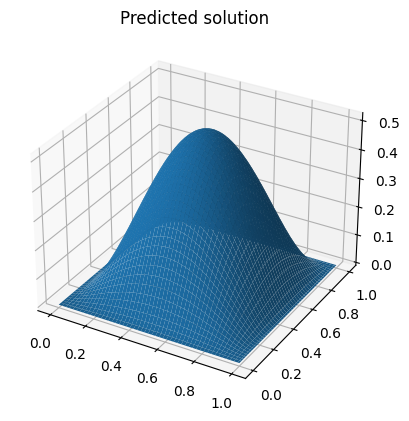

Train Epoch: 31 	Loss: 0.00225453521125018597
Train Epoch: 31 	Loss: 0.00217889668419957161
Train Epoch: 31 	Loss: 0.01304036378860473633
Train Epoch: 31 	Loss: 0.00299674994312226772

After Epoch 31, 	 Actual solution loss: 0.00000001259367678746



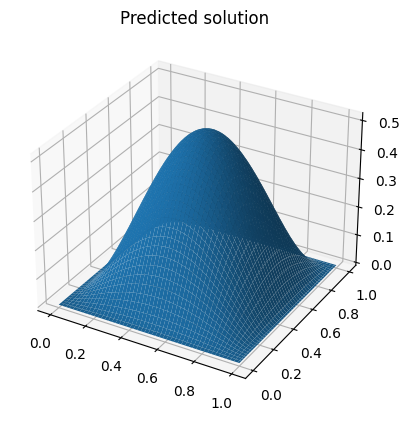

Train Epoch: 32 	Loss: 0.00170300528407096863
Train Epoch: 32 	Loss: 0.00178817985579371452
Train Epoch: 32 	Loss: 0.00393432984128594398
Train Epoch: 32 	Loss: 0.00503990473225712776

After Epoch 32, 	 Actual solution loss: 0.00000001381176526295



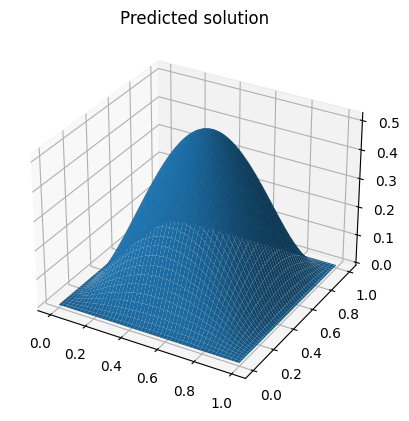

Train Epoch: 33 	Loss: 0.00165592681150883436
Train Epoch: 33 	Loss: 0.00172342394944280386
Train Epoch: 33 	Loss: 0.00190152099821716547
Train Epoch: 33 	Loss: 0.00123701919801533222

After Epoch 33, 	 Actual solution loss: 0.00000000484668007053



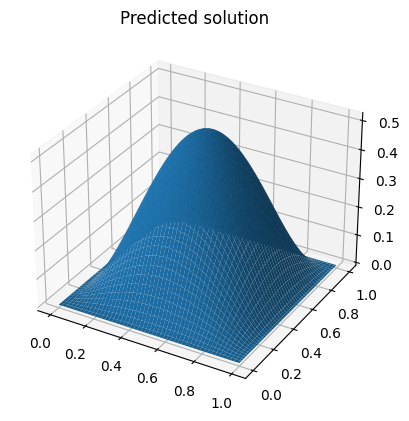

Train Epoch: 34 	Loss: 0.00180725078098475933
Train Epoch: 34 	Loss: 0.01067784521728754044
Train Epoch: 34 	Loss: 0.01611630432307720184
Train Epoch: 34 	Loss: 0.00233025359921157360

After Epoch 34, 	 Actual solution loss: 0.00000000326824524255



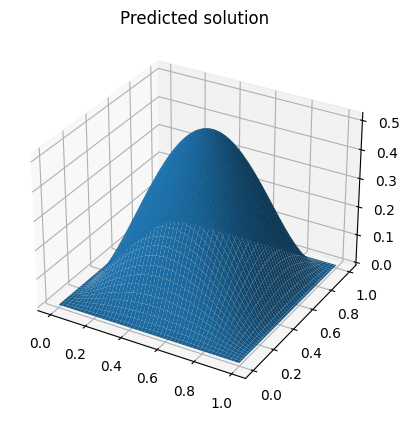

Train Epoch: 35 	Loss: 0.00620889104902744293
Train Epoch: 35 	Loss: 0.00450522871688008308
Train Epoch: 35 	Loss: 0.00678861374035477638
Train Epoch: 35 	Loss: 0.00393174681812524796

After Epoch 35, 	 Actual solution loss: 0.00000003919323695424



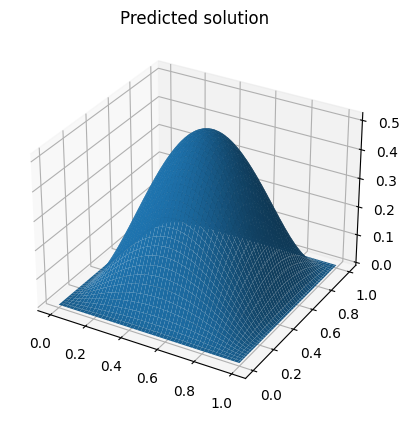

Train Epoch: 36 	Loss: 0.00203770585358142853
Train Epoch: 36 	Loss: 0.00261574098840355873
Train Epoch: 36 	Loss: 0.00216479762457311153
Train Epoch: 36 	Loss: 0.01432677078992128372

After Epoch 36, 	 Actual solution loss: 0.00000000494227529566



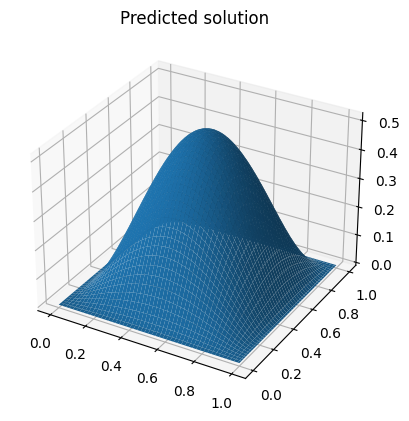

Train Epoch: 37 	Loss: 0.00366484210826456547
Train Epoch: 37 	Loss: 0.00250108703039586544
Train Epoch: 37 	Loss: 0.00236795819364488125
Train Epoch: 37 	Loss: 0.00197097077034413815

After Epoch 37, 	 Actual solution loss: 0.00000001555619033453



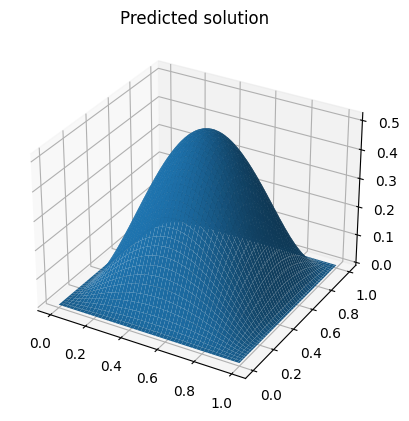

Train Epoch: 38 	Loss: 0.01105197425931692123
Train Epoch: 38 	Loss: 0.00257679400965571404
Train Epoch: 38 	Loss: 0.00201279437169432640
Train Epoch: 38 	Loss: 0.00707583408802747726

After Epoch 38, 	 Actual solution loss: 0.00000000580779705785



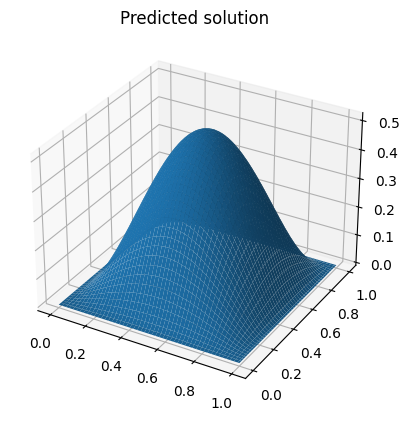

Train Epoch: 39 	Loss: 0.00256570940837264061
Train Epoch: 39 	Loss: 0.00265447166748344898
Train Epoch: 39 	Loss: 0.00172558426856994629


KeyboardInterrupt: 

In [7]:
net = FBPINN()#.to(device)
	
def init_normal(m):
	if type(m) == nn.Linear:
		nn.init.kaiming_normal_(m.weight)

net.apply(init_normal)

for eps in [0.1,0.05,0.03,0.01]:
	print('\n\n  Epsilon : {}\n\n'.format(eps))
	output,net = train(device,net,x,y,eps,learning_rate,epochs,batchflag,batchsize)
	plot_graph(output.detach().numpy(),"After one round")